In [1]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [3]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
from torchvision.models import resnet50,mobilenet_v3_large, efficientnet_b0
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from tqdm import tqdm
from PIL import Image
import random
import torch.nn.functional as F
import matplotlib.patches as patches
# ======================== Dataset Processing ========================== #

class TinyFaceDataset(Dataset):
    def __init__(self, root_dir, transform=None, is_train=True):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []
        self.is_train = is_train
        if self.is_train:
            # Load images and labels
            for identity_dir in os.listdir(root_dir):
                identity_path = os.path.join(root_dir, identity_dir)
                if os.path.isdir(identity_path):
                    for img_name in os.listdir(identity_path):
                        self.image_paths.append(os.path.join(identity_path, img_name))
                        self.labels.append(identity_dir)
        else:
            for img_name in os.listdir(root_dir):
                self.image_paths.append(os.path.join(root_dir, img_name))
                self.labels.append(img_name)
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        img = Image.open(img_path).convert('RGB')
        
        if self.transform:
            img = self.transform(img)
        if not self.is_train:
            label=label.split("_")[0]
        return img, int(label)

# ========================= Model Definition =========================== #
def get_model(model_name, num_classes):
    """
    Factory function to get a model based on the model name.
    """
    if model_name == "resnet50":
        model = resnet50(pretrained=True)
        model.fc = torch.nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "mobilenet_v3":
        model = mobilenet_v3_large(pretrained=True)
        model.classifier[3] = torch.nn.Linear(model.classifier[3].in_features, num_classes)
    elif model_name == "efficientnet_b0":
        model = efficientnet_b0(pretrained=True)
        model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, num_classes)
    else:
        raise ValueError(f"Unsupported model name: {model_name}")
    return model
    

def save_checkpoint(model, optimizer, history, path):
    """
    Save the model checkpoint.
    """
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': history,
    }, path)
    print(f"Model checkpoint saved at {path}")

def load_checkpoint(model, optimizer, path):
    """
    Load the model checkpoint.
    """
    checkpoint = torch.load(path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    history = checkpoint.get('history', None)
    print(f"Model checkpoint loaded from {path}")
    return model, optimizer, history


def calculate_training_rankings(model, dataloader, device, ranks=[1, 20]):
    """
    Calcula los rankings en el conjunto de entrenamiento
    """
    model.eval()
    all_features = []
    all_labels = []
    
    print("Extrayendo características del conjunto de entrenamiento...")
    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images = images.to(device)
            features = model(images)
            features = F.normalize(features, p=2, dim=1)
            all_features.append(features.cpu())
            all_labels.extend(labels.numpy())
            
    all_features = torch.cat(all_features, dim=0)
    
    # Calcula matriz de similitud
    similarity_matrix = torch.mm(all_features, all_features.t())
    similarity_matrix = (similarity_matrix + 1) / 2
    similarity_matrix = torch.pow(similarity_matrix, 2)
    
    # Calcula accuracies para cada rank
    accuracies = {}
    for rank in ranks:
        correct = 0
        total = 0
        
        for i, label in enumerate(all_labels):
            similarities = similarity_matrix[i]
            _, top_indices = torch.topk(similarities, k=rank+1)  # +1 para excluir la propia imagen
            top_labels = [all_labels[idx] for idx in top_indices[1:rank+1]]  # Excluye la propia imagen
            
            if label in top_labels:
                correct += 1
            total += 1
        
        accuracies[rank] = correct / total
    
    return accuracies

def show_random_top10_training(model, dataloader, device):
    """
    Muestra un ejemplo aleatorio con sus top 10 matches del conjunto de entrenamiento,
    asegurando que haya al menos dos matches correctos.
    """
    model.eval()
    max_attempts = 1000000  # Número máximo de intentos para encontrar un ejemplo adecuado

    # Obtener características de todas las imágenes
    all_features = []
    all_labels = []
    all_paths = []
    
    print("Procesando conjunto de entrenamiento para top 10...")
    with torch.no_grad():
        for batch_imgs, batch_labels in tqdm(dataloader):
            batch_imgs = batch_imgs.to(device)
            features = model(batch_imgs)
            features = F.normalize(features, p=2, dim=1)
            all_features.append(features.cpu())
            all_labels.extend(batch_labels.numpy())
            all_paths.extend([dataloader.dataset.image_paths[i] for i in range(len(batch_labels))])

    all_features = torch.cat(all_features, dim=0)

    # Buscar un ejemplo con al menos dos matches
    for attempt in range(max_attempts):
        # Seleccionar una imagen aleatoria
        query_idx = random.randint(0, len(all_labels) - 1)
        query_label = str(all_labels[query_idx])
        query_features = all_features[query_idx].unsqueeze(0)

        # Calcular similitudes
        similarities = torch.mm(query_features, all_features.t())
        similarities = (similarities + 1) / 2
        similarities = torch.pow(similarities, 2)

        # Obtener top matches excluyendo la imagen query
        top_scores, top_indices = torch.topk(similarities[0], k=len(dataloader.dataset))
        
        # Filtrar la imagen query y obtener los primeros 10 matches únicos
        filtered_matches = []
        seen_paths = {all_paths[query_idx]}
        for idx in top_indices:
            img_path = all_paths[idx]
            if img_path not in seen_paths:
                seen_paths.add(img_path)
                filtered_matches.append((idx, similarities[0][idx]))
                if len(filtered_matches) == 10:
                    break

        # Contar matches correctos
        correct_matches = sum(1 for idx, _ in filtered_matches 
                            if str(all_labels[idx]) == query_label)
        
        if correct_matches >= 2:
            # Encontramos un ejemplo adecuado
            break
    else:
        print("No se encontró un ejemplo con suficientes matches después de", max_attempts, "intentos.")
        return

    # Visualización
    plt.figure(figsize=(24, 12), dpi=100)

    # Imagen query
    ax_query = plt.subplot2grid((3, 5), (0, 1), colspan=3)
    query_img = Image.open(all_paths[query_idx])
    ax_query.imshow(query_img)
    ax_query.set_title(f'Query Image\nTrue Label: {query_label}\nMatches in Top 10: {correct_matches}', 
                      pad=10, fontsize=14, fontweight='bold')
    ax_query.axis('off')

    # Mostrar top 10 matches
    for i, (idx, score) in enumerate(filtered_matches):
        row = (i // 5) + 1
        col = i % 5
        ax = plt.subplot2grid((3, 5), (row, col))
        
        gallery_img = Image.open(all_paths[idx])
        ax.imshow(gallery_img)
        
        gallery_label = str(all_labels[idx])
        is_match = gallery_label == query_label
        
        if is_match:
            # Crear rectángulo que cubra toda la imagen
            img_height, img_width = gallery_img.size[1], gallery_img.size[0]
            
            # Múltiples rectángulos con diferentes grosores y opacidades
            for j in range(3):
                rect = patches.Rectangle(
                    (-5, -5),  # Extender más allá de los bordes
                    img_width + 10,  # Añadir padding
                    img_height + 10,
                    linewidth=6 - j,  # Grosor descendente
                    edgecolor='green',
                    facecolor='none',
                    alpha=0.8 - j*0.2,  # Opacidad descendente
                    transform=ax.transData
                )
                ax.add_patch(rect)
            
            # Añadir sombreado verde suave
            ax.add_patch(patches.Rectangle(
                (-5, -5),
                img_width + 10,
                img_height + 10,
                facecolor='green',
                alpha=0.1,
                transform=ax.transData
            ))

        ax.set_title(
            f'Rank {i+1}\nLabel: {gallery_label}\nScore: {score:.3f}',
            fontsize=10,
            fontweight='bold',
            pad=5,
            color='darkgreen' if is_match else 'black'
        )
        ax.axis('off')

    plt.suptitle('Training Example: Query Image and Top 10 Matches', 
                 fontsize=16, fontweight='bold', y=0.95)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    print(f"\nPrecisión Top-10 para este ejemplo: {correct_matches/10:.2%}")
    print(f"Número total de matches correctos: {correct_matches}")

def train_model(model, dataloader, criterion, optimizer, num_epochs=25, device='cuda', patience=3):
    """
    Entrena el modelo con early stopping y evaluación en training set
    """
    model = model.to(device)
    history = {'loss': [], 'accuracy': []}
    best_acc = 0
    patience_counter = 0
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct_preds = 0
        total_preds = 0
        
        for inputs, labels in tqdm(dataloader):
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct_preds += torch.sum(preds == labels.data)
            total_preds += labels.size(0)
        
        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = correct_preds.double() / total_preds
        history['loss'].append(epoch_loss)
        history['accuracy'].append(epoch_acc.item())
        
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}")
        
        # Early stopping check
        if epoch_acc > best_acc:
            best_acc = epoch_acc
            patience_counter = 0
        else:
            patience_counter += 1
            
        if patience_counter >= patience:
            print(f"\nEarly stopping triggered after {epoch+1} epochs")
            break
    
    print("\nCalculando métricas en conjunto de entrenamiento...")
    training_ranks = calculate_training_rankings(model, dataloader, device)
    print("\nRankings en conjunto de entrenamiento:")
    for rank, acc in training_ranks.items():
        print(f"Rank-{rank} Accuracy: {acc:.4f}")
        
    print("\nMostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...")
    show_random_top10_training(model, dataloader, device)
    
    return model, history

def train_specific_model(model_name, train_path, batch_size=32, num_epochs=12, learning_rate=1e-4):
    """
    Función para entrenar un modelo específico
    """
    # Configuración
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    transform = transforms.Compose([
        transforms.Resize((256,256)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    
    # Preparar dataset y dataloader
    training_set = TinyFaceDataset(train_path, transform, is_train=True)
    training_loader = DataLoader(training_set, batch_size=batch_size, shuffle=True)
    
    # Crear modelo
    num_classes = 2570
    model = get_model(model_name, num_classes)
    model = model.to(device)
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    
    # Checkpoint path
    checkpoint_path = f"{model_name}_tinyface_sr_checkpoint.pth" if train_path == 'tinyface_sr/Training_Set' else f"{model_name}_tinyface_checkpoint.pth"
    
    try:
        model, optimizer, history = load_checkpoint(model, optimizer, checkpoint_path)
        print(f"Checkpoint cargado para {model_name}")
        print("\nCalculando métricas en conjunto de entrenamiento...")
        training_ranks = calculate_training_rankings(model, training_loader,device)
        print("\nRankings en conjunto de entrenamiento:")
        for rank, acc in training_ranks.items():
            print(f"Rank-{rank} Accuracy: {acc:.4f}")
        print("\nMostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...")
        show_random_top10_training(model, training_loader, device)
    except FileNotFoundError:
        print(f"Entrenando {model_name} desde cero...")
        trained_model, history = train_model(model, training_loader, criterion, optimizer, 
                                           num_epochs=num_epochs, device=device)
        save_checkpoint(trained_model, optimizer, history, checkpoint_path)
    
    # Visualizar resultados del entrenamiento
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].plot(history['loss'], label='Loss')
    ax[0].set_title(f'Función de pérdida {model_name}')
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].legend()
    for accuracy in history['accuracy']:
        if accuracy < 0:
            history['accuracy'].remove(accuracy)
    
    ax[1].plot(history['accuracy'], label='Accuracy')
    ax[1].set_title(f'Accuracy {model_name}')
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('Accuracy')
    ax[1].legend()
    
    plt.tight_layout()
    plt.show()
    name_fig = f"{model_name}_training_results_sr.png" if train_path == 'tinyface_sr/Training_Set' else f"{model_name}_training_results.png"
    fig.savefig(name_fig)
    

In [4]:
import time
training_set_path = 'tinyface/Training_Set'
training_set= TinyFaceDataset(training_set_path, transform=None, is_train=True)
print(f"Conjunto de entrenamiento: {len(training_set)} imágenes")
training_set_path_sr = 'tinyface_sr/Training_Set'
training_set_sr= TinyFaceDataset(training_set_path_sr, transform=None, is_train=True)
print(f"Conjunto de entrenamiento: {len(training_set_sr)} imágenes")

Conjunto de entrenamiento: 7804 imágenes
Conjunto de entrenamiento: 7804 imágenes


## Ada entrenamiento

## Prueba de entrenamiento sin SR resnet50

/tmp/ipykernel_11502/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path)


Entrenando resnet50 desde cero...


100%|██████████| 244/244 [03:17<00:00,  1.23it/s]


Epoch 1/30, Loss: 7.5981, Accuracy: 0.0017


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 2/30, Loss: 7.2407, Accuracy: 0.0054


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 3/30, Loss: 7.0745, Accuracy: 0.0131


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 4/30, Loss: 6.8980, Accuracy: 0.0254


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 5/30, Loss: 6.6959, Accuracy: 0.0424


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 6/30, Loss: 6.5228, Accuracy: 0.0579


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 7/30, Loss: 6.3371, Accuracy: 0.0744


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 8/30, Loss: 6.1770, Accuracy: 0.1010


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 9/30, Loss: 6.0147, Accuracy: 0.1294


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 10/30, Loss: 5.8528, Accuracy: 0.1648


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 11/30, Loss: 5.6782, Accuracy: 0.1991


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 12/30, Loss: 5.5336, Accuracy: 0.2355


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 13/30, Loss: 5.4131, Accuracy: 0.2697


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 14/30, Loss: 5.3172, Accuracy: 0.3050


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 15/30, Loss: 5.1957, Accuracy: 0.3344


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 16/30, Loss: 5.1106, Accuracy: 0.3534


100%|██████████| 244/244 [01:14<00:00,  3.28it/s]


Epoch 17/30, Loss: 5.0467, Accuracy: 0.3730


100%|██████████| 244/244 [01:14<00:00,  3.30it/s]


Epoch 18/30, Loss: 4.9809, Accuracy: 0.3872


100%|██████████| 244/244 [01:14<00:00,  3.30it/s]


Epoch 19/30, Loss: 4.9418, Accuracy: 0.3983


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 20/30, Loss: 4.9046, Accuracy: 0.4066


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 21/30, Loss: 4.8562, Accuracy: 0.4095


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 22/30, Loss: 4.8208, Accuracy: 0.4147


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 23/30, Loss: 4.7902, Accuracy: 0.4191


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 24/30, Loss: 4.7925, Accuracy: 0.4225


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 25/30, Loss: 4.7545, Accuracy: 0.4266


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 26/30, Loss: 4.7188, Accuracy: 0.4281


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 27/30, Loss: 4.7276, Accuracy: 0.4295


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 28/30, Loss: 4.6905, Accuracy: 0.4285


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 29/30, Loss: 4.7191, Accuracy: 0.4284


100%|██████████| 244/244 [01:14<00:00,  3.29it/s]


Epoch 30/30, Loss: 4.6873, Accuracy: 0.4316

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:24<00:00, 10.05it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.5538
Rank-20 Accuracy: 0.7207

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:24<00:00,  9.93it/s]


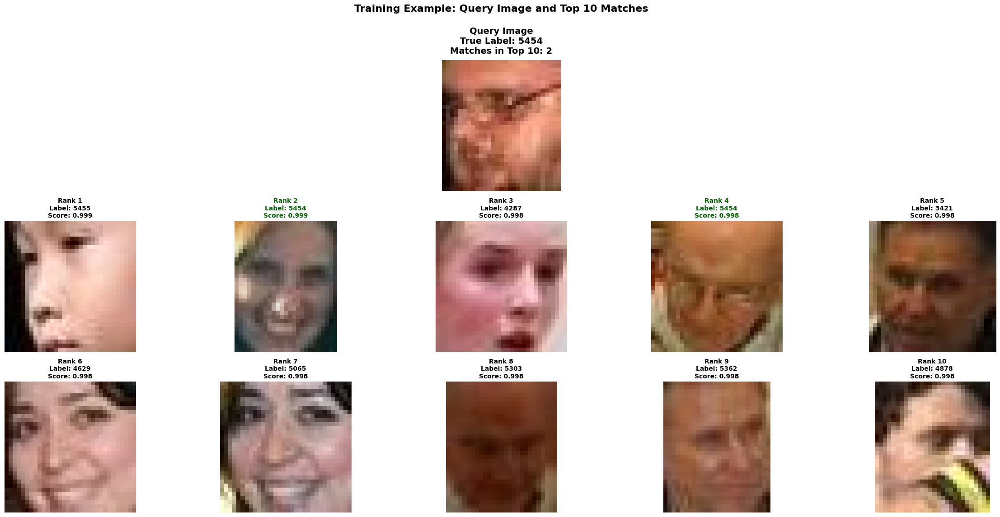


Precisión Top-10 para este ejemplo: 20.00%
Número total de matches correctos: 2
Model checkpoint saved at resnet50_tinyface_checkpoint.pth


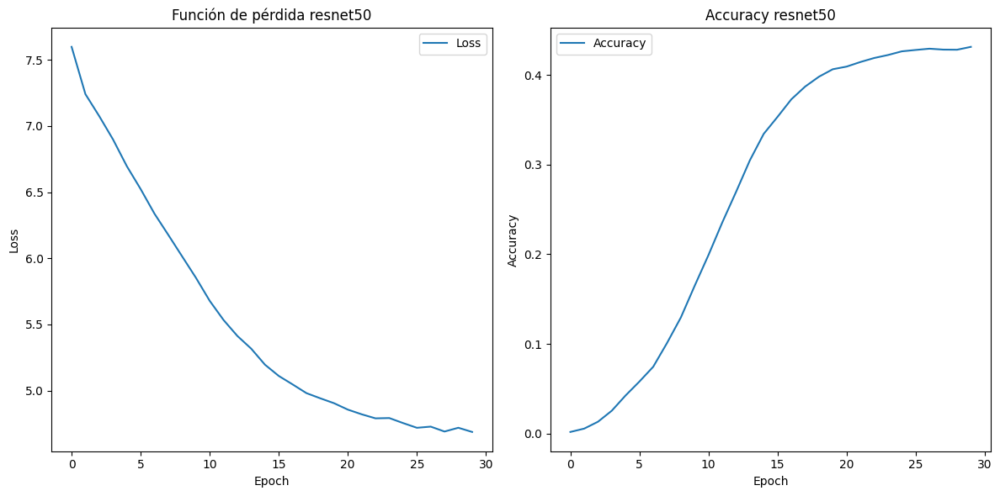

Tiempo de ejecución: 2400.4049 segundos


In [ ]:
start_time = time.time()
train_specific_model("resnet50", "tinyface/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")

## Prueba de entrenamiento sin SR mobilenetv3

/tmp/ipykernel_3619/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path)


Entrenando mobilenet_v3 desde cero...


100%|██████████| 244/244 [00:49<00:00,  4.89it/s]


Epoch 1/30, Loss: 7.5484, Accuracy: 0.0074


100%|██████████| 244/244 [00:49<00:00,  4.90it/s]


Epoch 2/30, Loss: 6.9517, Accuracy: 0.0296


100%|██████████| 244/244 [00:49<00:00,  4.90it/s]


Epoch 3/30, Loss: 6.4544, Accuracy: 0.0869


100%|██████████| 244/244 [00:49<00:00,  4.91it/s]


Epoch 4/30, Loss: 5.9789, Accuracy: 0.1776


100%|██████████| 244/244 [00:49<00:00,  4.91it/s]


Epoch 5/30, Loss: 5.5953, Accuracy: 0.2827


100%|██████████| 244/244 [00:49<00:00,  4.91it/s]


Epoch 6/30, Loss: 5.3069, Accuracy: 0.3526


100%|██████████| 244/244 [00:49<00:00,  4.91it/s]


Epoch 7/30, Loss: 5.1230, Accuracy: 0.3907


100%|██████████| 244/244 [00:49<00:00,  4.91it/s]


Epoch 8/30, Loss: 5.0148, Accuracy: 0.4100


100%|██████████| 244/244 [00:49<00:00,  4.90it/s]


Epoch 9/30, Loss: 4.9022, Accuracy: 0.4221


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 10/30, Loss: 4.8290, Accuracy: 0.4277


100%|██████████| 244/244 [00:50<00:00,  4.88it/s]


Epoch 11/30, Loss: 4.7673, Accuracy: 0.4299


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 12/30, Loss: 4.7573, Accuracy: 0.4329


100%|██████████| 244/244 [00:50<00:00,  4.86it/s]


Epoch 13/30, Loss: 4.7104, Accuracy: 0.4338


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 14/30, Loss: 4.6805, Accuracy: 0.4338


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 15/30, Loss: 4.6725, Accuracy: 0.4344


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 16/30, Loss: 4.6632, Accuracy: 0.4348


100%|██████████| 244/244 [00:49<00:00,  4.88it/s]


Epoch 17/30, Loss: 4.6418, Accuracy: 0.4346


100%|██████████| 244/244 [00:49<00:00,  4.89it/s]


Epoch 18/30, Loss: 4.6206, Accuracy: 0.4346


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 19/30, Loss: 4.6151, Accuracy: 0.4350


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 20/30, Loss: 4.6131, Accuracy: 0.4352


100%|██████████| 244/244 [00:50<00:00,  4.86it/s]


Epoch 21/30, Loss: 4.6104, Accuracy: 0.4349


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 22/30, Loss: 4.5868, Accuracy: 0.4353


100%|██████████| 244/244 [00:49<00:00,  4.88it/s]


Epoch 23/30, Loss: 4.5601, Accuracy: 0.4354


100%|██████████| 244/244 [00:50<00:00,  4.88it/s]


Epoch 24/30, Loss: 4.5835, Accuracy: 0.4353


100%|██████████| 244/244 [00:50<00:00,  4.88it/s]


Epoch 25/30, Loss: 4.5890, Accuracy: 0.4354


100%|██████████| 244/244 [00:50<00:00,  4.87it/s]


Epoch 26/30, Loss: 4.5766, Accuracy: 0.4353

Early stopping triggered after 26 epochs

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:13<00:00, 18.48it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.5123
Rank-20 Accuracy: 0.7148

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:13<00:00, 18.45it/s]


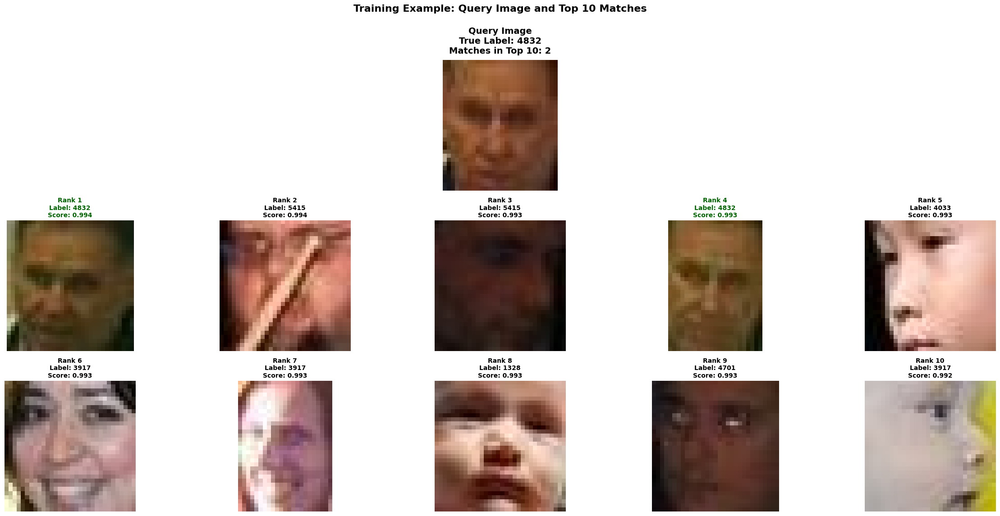


Precisión Top-10 para este ejemplo: 20.00%
Número total de matches correctos: 2
Model checkpoint saved at mobilenet_v3_tinyface_checkpoint.pth


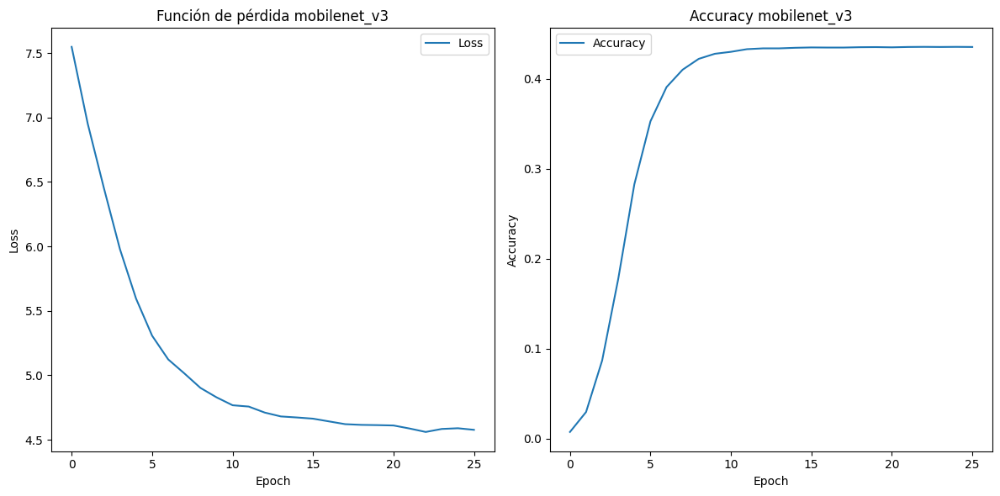

Tiempo de ejecución: 1328.1347 segundos


In [10]:
start_time = time.time()
train_specific_model("mobilenet_v3", "tinyface/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")

## Prueba de entrenamiento sin SR efficientnetb0

/home/juan/Escritorio/Proyecto/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_3619/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects wi

Entrenando efficientnet_b0 desde cero...


100%|██████████| 244/244 [01:35<00:00,  2.56it/s]


Epoch 1/30, Loss: 7.5648, Accuracy: 0.0065


100%|██████████| 244/244 [01:07<00:00,  3.63it/s]


Epoch 2/30, Loss: 7.0894, Accuracy: 0.0154


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 3/30, Loss: 6.7956, Accuracy: 0.0365


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 4/30, Loss: 6.5419, Accuracy: 0.0629


100%|██████████| 244/244 [01:07<00:00,  3.63it/s]


Epoch 5/30, Loss: 6.2906, Accuracy: 0.0988


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 6/30, Loss: 6.0811, Accuracy: 0.1475


100%|██████████| 244/244 [01:07<00:00,  3.63it/s]


Epoch 7/30, Loss: 5.8588, Accuracy: 0.2062


100%|██████████| 244/244 [01:07<00:00,  3.63it/s]


Epoch 8/30, Loss: 5.6817, Accuracy: 0.2631


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 9/30, Loss: 5.4961, Accuracy: 0.3121


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 10/30, Loss: 5.3631, Accuracy: 0.3492


100%|██████████| 244/244 [01:07<00:00,  3.60it/s]


Epoch 11/30, Loss: 5.2546, Accuracy: 0.3802


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 12/30, Loss: 5.1363, Accuracy: 0.3980


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 13/30, Loss: 5.0678, Accuracy: 0.4127


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 14/30, Loss: 4.9890, Accuracy: 0.4213


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 15/30, Loss: 4.9435, Accuracy: 0.4250


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 16/30, Loss: 4.9008, Accuracy: 0.4285


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 17/30, Loss: 4.8832, Accuracy: 0.4307


100%|██████████| 244/244 [01:07<00:00,  3.60it/s]


Epoch 18/30, Loss: 4.8523, Accuracy: 0.4318


100%|██████████| 244/244 [01:07<00:00,  3.61it/s]


Epoch 19/30, Loss: 4.8230, Accuracy: 0.4332


100%|██████████| 244/244 [01:07<00:00,  3.59it/s]


Epoch 20/30, Loss: 4.8026, Accuracy: 0.4340


100%|██████████| 244/244 [01:07<00:00,  3.60it/s]


Epoch 21/30, Loss: 4.7712, Accuracy: 0.4339


100%|██████████| 244/244 [01:07<00:00,  3.62it/s]


Epoch 22/30, Loss: 4.7919, Accuracy: 0.4336


100%|██████████| 244/244 [01:07<00:00,  3.60it/s]


Epoch 23/30, Loss: 4.7684, Accuracy: 0.4345


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 24/30, Loss: 4.7587, Accuracy: 0.4345


100%|██████████| 244/244 [01:08<00:00,  3.58it/s]


Epoch 25/30, Loss: 4.7555, Accuracy: 0.4346


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 26/30, Loss: 4.7723, Accuracy: 0.4350


100%|██████████| 244/244 [01:08<00:00,  3.58it/s]


Epoch 27/30, Loss: 4.7342, Accuracy: 0.4352


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 28/30, Loss: 4.7484, Accuracy: 0.4348


100%|██████████| 244/244 [01:08<00:00,  3.58it/s]


Epoch 29/30, Loss: 4.7246, Accuracy: 0.4349


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 30/30, Loss: 4.7233, Accuracy: 0.4345

Early stopping triggered after 30 epochs

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:18<00:00, 12.99it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.5296
Rank-20 Accuracy: 0.7160

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:18<00:00, 13.23it/s]


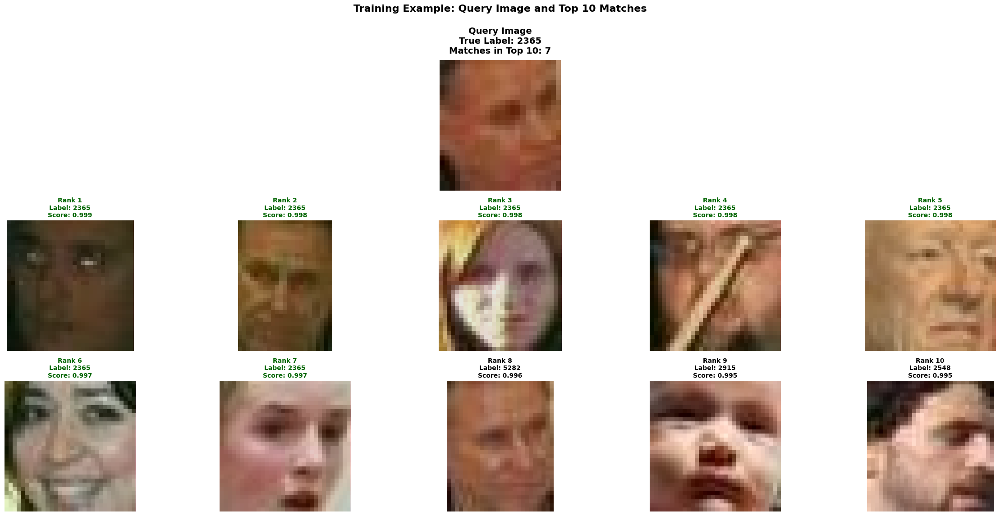


Precisión Top-10 para este ejemplo: 70.00%
Número total de matches correctos: 7
Model checkpoint saved at efficientnet_b0_tinyface_checkpoint.pth


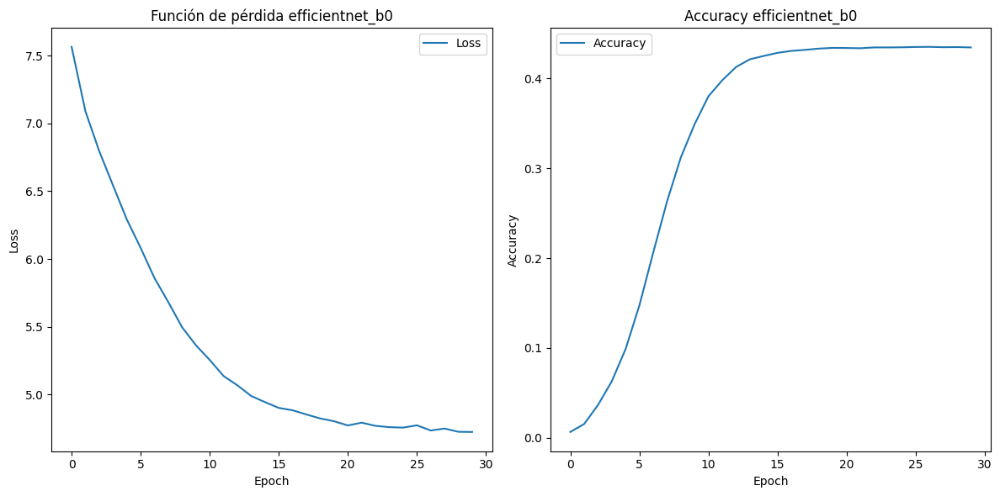

Tiempo de ejecución: 2098.7086 segundos


In [6]:
start_time = time.time()
train_specific_model("efficientnet_b0", "tinyface/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")

## Entrenamiento Resnet50 

/tmp/ipykernel_11502/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(path)


Entrenando resnet50 desde cero...


100%|██████████| 244/244 [01:15<00:00,  3.24it/s]


Epoch 1/30, Loss: 7.5996, Accuracy: 0.0019


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 2/30, Loss: 7.2272, Accuracy: 0.0072


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 3/30, Loss: 7.0447, Accuracy: 0.0145


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 4/30, Loss: 6.8431, Accuracy: 0.0261


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 5/30, Loss: 6.6633, Accuracy: 0.0466


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 6/30, Loss: 6.4637, Accuracy: 0.0684


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 7/30, Loss: 6.2512, Accuracy: 0.0946


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 8/30, Loss: 6.0899, Accuracy: 0.1224


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 9/30, Loss: 5.8802, Accuracy: 0.1561


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 10/30, Loss: 5.7363, Accuracy: 0.1930


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 11/30, Loss: 5.5924, Accuracy: 0.2313


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 12/30, Loss: 5.4403, Accuracy: 0.2700


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 13/30, Loss: 5.3101, Accuracy: 0.3056


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 14/30, Loss: 5.1848, Accuracy: 0.3347


100%|██████████| 244/244 [01:17<00:00,  3.13it/s]


Epoch 15/30, Loss: 5.0799, Accuracy: 0.3555


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 16/30, Loss: 5.0438, Accuracy: 0.3752


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 17/30, Loss: 4.9702, Accuracy: 0.3908


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 18/30, Loss: 4.9107, Accuracy: 0.4002


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 19/30, Loss: 4.8808, Accuracy: 0.4061


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 20/30, Loss: 4.8491, Accuracy: 0.4130


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 21/30, Loss: 4.8278, Accuracy: 0.4154


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 22/30, Loss: 4.7751, Accuracy: 0.4207


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 23/30, Loss: 4.7665, Accuracy: 0.4220


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 24/30, Loss: 4.7758, Accuracy: 0.4238


100%|██████████| 244/244 [01:15<00:00,  3.23it/s]


Epoch 25/30, Loss: 4.7519, Accuracy: 0.4261


100%|██████████| 244/244 [01:15<00:00,  3.24it/s]


Epoch 26/30, Loss: 4.7282, Accuracy: 0.4267


100%|██████████| 244/244 [01:15<00:00,  3.25it/s]


Epoch 27/30, Loss: 4.7153, Accuracy: 0.4275


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 28/30, Loss: 4.7135, Accuracy: 0.4279


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 29/30, Loss: 4.6857, Accuracy: 0.4293


100%|██████████| 244/244 [01:15<00:00,  3.22it/s]


Epoch 30/30, Loss: 4.6921, Accuracy: 0.4298

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:26<00:00,  9.26it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.5593
Rank-20 Accuracy: 0.7230

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:25<00:00,  9.47it/s]


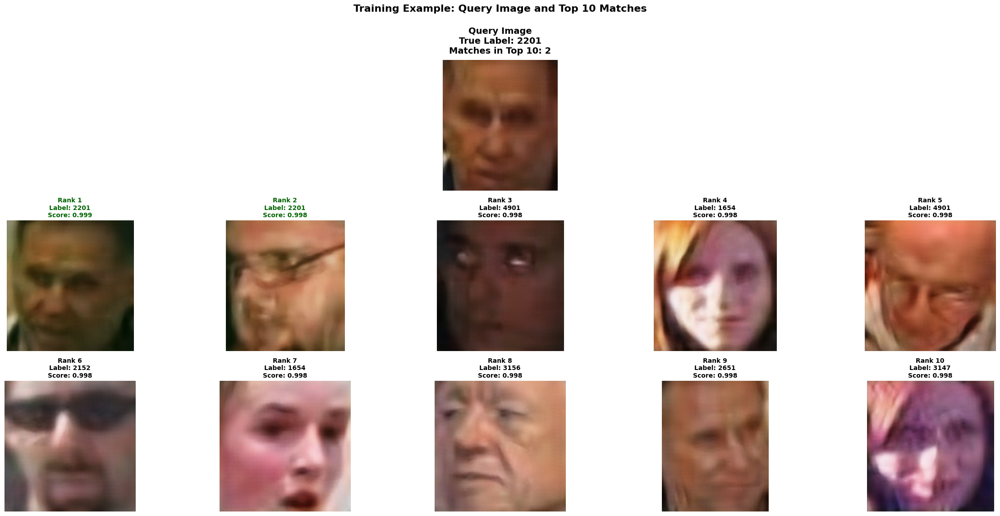


Precisión Top-10 para este ejemplo: 20.00%
Número total de matches correctos: 2
Model checkpoint saved at resnet50_tinyface_sr_checkpoint.pth


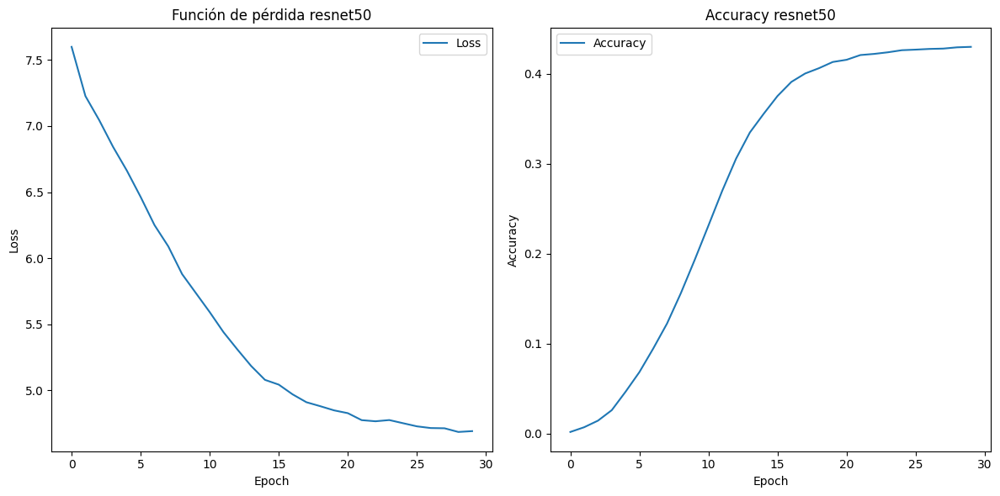

Tiempo de ejecución: 2327.1426 segundos


In [50]:
start_time = time.time()
train_specific_model("resnet50", "tinyface_sr/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")

## Entrenamiento mobileNetV2

/home/juan/Escritorio/Proyecto/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/juan/Escritorio/Proyecto/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_3619/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github

Entrenando mobilenet_v3 desde cero...


100%|██████████| 244/244 [00:52<00:00,  4.61it/s]


Epoch 1/30, Loss: 7.5530, Accuracy: 0.0068


100%|██████████| 244/244 [00:51<00:00,  4.78it/s]


Epoch 2/30, Loss: 6.9448, Accuracy: 0.0283


100%|██████████| 244/244 [00:51<00:00,  4.76it/s]


Epoch 3/30, Loss: 6.4257, Accuracy: 0.0878


100%|██████████| 244/244 [00:50<00:00,  4.80it/s]


Epoch 4/30, Loss: 5.9555, Accuracy: 0.1870


100%|██████████| 244/244 [00:50<00:00,  4.81it/s]


Epoch 5/30, Loss: 5.5535, Accuracy: 0.2906


100%|██████████| 244/244 [00:51<00:00,  4.70it/s]


Epoch 6/30, Loss: 5.2873, Accuracy: 0.3621


100%|██████████| 244/244 [00:50<00:00,  4.82it/s]


Epoch 7/30, Loss: 5.0971, Accuracy: 0.4008


100%|██████████| 244/244 [00:50<00:00,  4.81it/s]


Epoch 8/30, Loss: 4.9786, Accuracy: 0.4171


100%|██████████| 244/244 [00:50<00:00,  4.80it/s]


Epoch 9/30, Loss: 4.8863, Accuracy: 0.4254


100%|██████████| 244/244 [00:50<00:00,  4.82it/s]


Epoch 10/30, Loss: 4.8132, Accuracy: 0.4295


100%|██████████| 244/244 [00:50<00:00,  4.82it/s]


Epoch 11/30, Loss: 4.7692, Accuracy: 0.4325


100%|██████████| 244/244 [00:50<00:00,  4.81it/s]


Epoch 12/30, Loss: 4.7471, Accuracy: 0.4334


100%|██████████| 244/244 [00:51<00:00,  4.77it/s]


Epoch 13/30, Loss: 4.7144, Accuracy: 0.4344


100%|██████████| 244/244 [00:50<00:00,  4.81it/s]


Epoch 14/30, Loss: 4.6737, Accuracy: 0.4349


100%|██████████| 244/244 [00:50<00:00,  4.79it/s]


Epoch 15/30, Loss: 4.6836, Accuracy: 0.4344


100%|██████████| 244/244 [00:50<00:00,  4.80it/s]


Epoch 16/30, Loss: 4.6459, Accuracy: 0.4352


100%|██████████| 244/244 [00:50<00:00,  4.81it/s]


Epoch 17/30, Loss: 4.6432, Accuracy: 0.4354


100%|██████████| 244/244 [00:51<00:00,  4.76it/s]


Epoch 18/30, Loss: 4.6174, Accuracy: 0.4349


100%|██████████| 244/244 [00:50<00:00,  4.80it/s]


Epoch 19/30, Loss: 4.6014, Accuracy: 0.4352


100%|██████████| 244/244 [00:50<00:00,  4.83it/s]


Epoch 20/30, Loss: 4.6023, Accuracy: 0.4350

Early stopping triggered after 20 epochs

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:14<00:00, 16.57it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.4882
Rank-20 Accuracy: 0.6930

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:15<00:00, 16.26it/s]


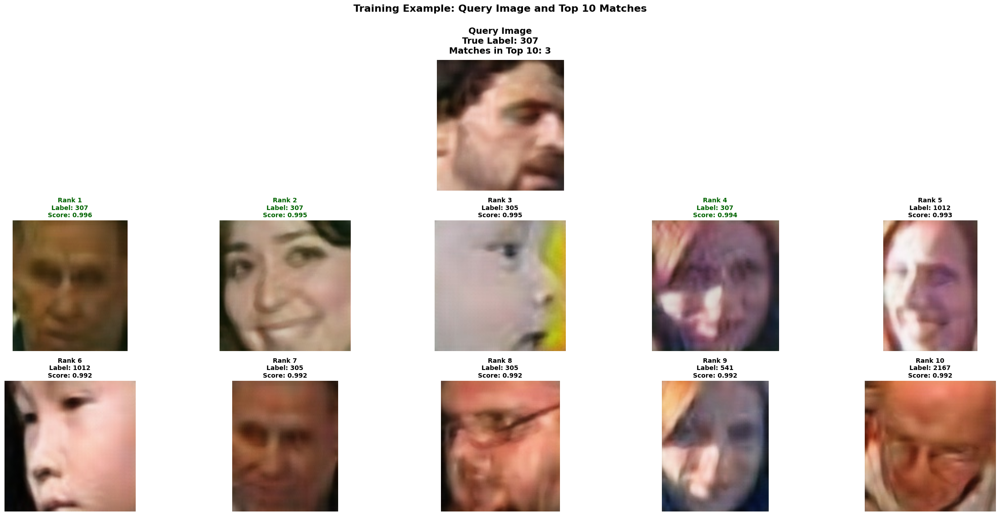


Precisión Top-10 para este ejemplo: 30.00%
Número total de matches correctos: 3
Model checkpoint saved at mobilenet_v3_tinyface_sr_checkpoint.pth


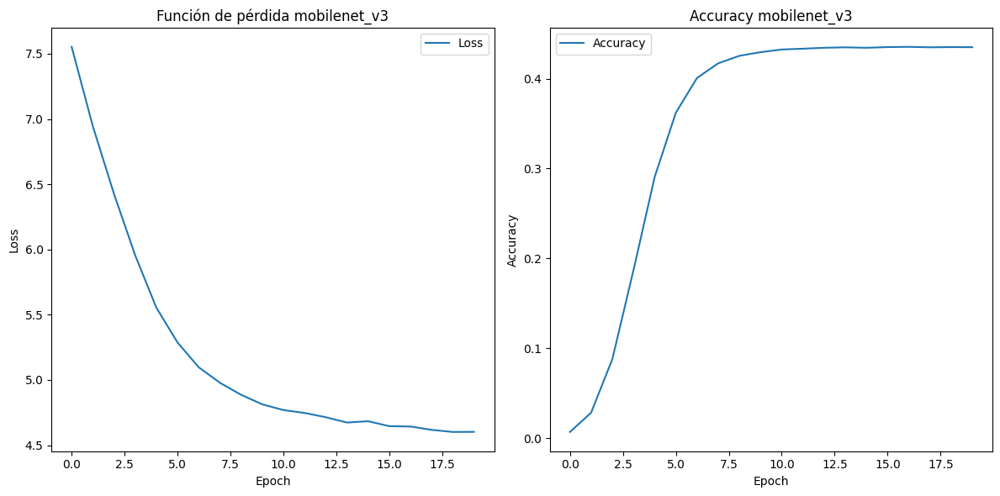

Tiempo de ejecución: 1052.6798 segundos


In [7]:
start_time = time.time()
train_specific_model('mobilenet_v3', "tinyface_sr/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")

## Entrenamiento efficientNetB0

/home/juan/Escritorio/Proyecto/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/juan/Escritorio/Proyecto/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_3619/3983097228.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/p

Entrenando efficientnet_b0 desde cero...


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 1/30, Loss: 7.5678, Accuracy: 0.0041


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 2/30, Loss: 7.0728, Accuracy: 0.0126


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 3/30, Loss: 6.7614, Accuracy: 0.0349


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 4/30, Loss: 6.5330, Accuracy: 0.0696


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 5/30, Loss: 6.2838, Accuracy: 0.1064


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 6/30, Loss: 6.0577, Accuracy: 0.1567


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 7/30, Loss: 5.8311, Accuracy: 0.2134


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 8/30, Loss: 5.6633, Accuracy: 0.2728


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 9/30, Loss: 5.5185, Accuracy: 0.3130


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 10/30, Loss: 5.3382, Accuracy: 0.3538


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 11/30, Loss: 5.2442, Accuracy: 0.3842


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 12/30, Loss: 5.1300, Accuracy: 0.4001


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 13/30, Loss: 5.0370, Accuracy: 0.4120


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 14/30, Loss: 4.9976, Accuracy: 0.4208


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 15/30, Loss: 4.9577, Accuracy: 0.4247


100%|██████████| 244/244 [01:08<00:00,  3.57it/s]


Epoch 16/30, Loss: 4.8864, Accuracy: 0.4290


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 17/30, Loss: 4.8582, Accuracy: 0.4298


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 18/30, Loss: 4.8257, Accuracy: 0.4323


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 19/30, Loss: 4.8201, Accuracy: 0.4323


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 20/30, Loss: 4.8089, Accuracy: 0.4334


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 21/30, Loss: 4.7959, Accuracy: 0.4338


100%|██████████| 244/244 [01:08<00:00,  3.54it/s]


Epoch 22/30, Loss: 4.7693, Accuracy: 0.4344


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 23/30, Loss: 4.7649, Accuracy: 0.4343


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 24/30, Loss: 4.7611, Accuracy: 0.4345


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 25/30, Loss: 4.7449, Accuracy: 0.4341


100%|██████████| 244/244 [01:08<00:00,  3.56it/s]


Epoch 26/30, Loss: 4.7450, Accuracy: 0.4345


100%|██████████| 244/244 [01:08<00:00,  3.55it/s]


Epoch 27/30, Loss: 4.7424, Accuracy: 0.4345

Early stopping triggered after 27 epochs

Calculando métricas en conjunto de entrenamiento...
Extrayendo características del conjunto de entrenamiento...


100%|██████████| 244/244 [00:19<00:00, 12.51it/s]



Rankings en conjunto de entrenamiento:
Rank-1 Accuracy: 0.5183
Rank-20 Accuracy: 0.7049

Mostrando ejemplo aleatorio con top 10 matches del conjunto de entrenamiento...
Procesando conjunto de entrenamiento para top 10...


100%|██████████| 244/244 [00:19<00:00, 12.49it/s]


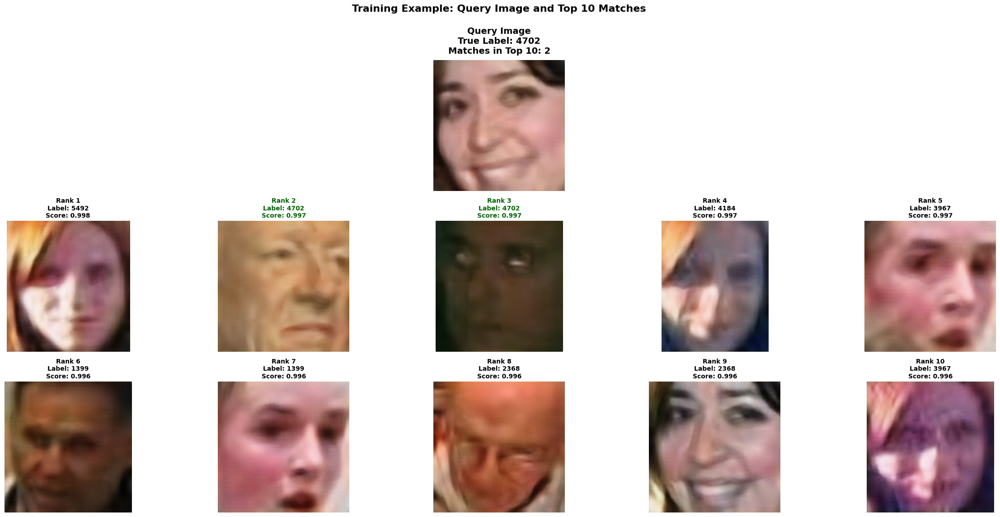


Precisión Top-10 para este ejemplo: 20.00%
Número total de matches correctos: 2
Model checkpoint saved at efficientnet_b0_tinyface_sr_checkpoint.pth


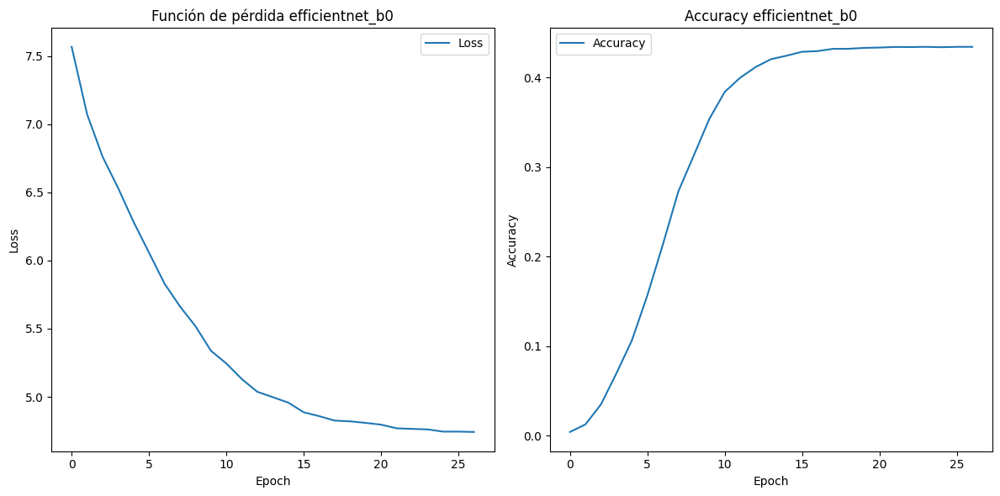

Tiempo de ejecución: 1894.6138 segundos


In [8]:
start_time = time.time()
train_specific_model('efficientnet_b0', "tinyface_sr/Training_Set", num_epochs=30)
end=time.time()
print(f"Tiempo de ejecución: {end - start_time:.4f} segundos")


Evaluando resnet50 en low resolution...


/tmp/ipykernel_3586/3659349381.py:262: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


Procesando galería...


100%|██████████| 139/139 [00:13<00:00, 10.30it/s]


Procesando probe images...


100%|██████████| 117/117 [00:11<00:00, 10.24it/s]


Calculando similitudes...

Resultados para resnet50:
Rank-1 Accuracy: 0.3425
Rank-20 Accuracy: 0.5995
Mean Average Precision (mAP): 0.3058

Ejemplos aleatorios de matches correctos de rank-1:


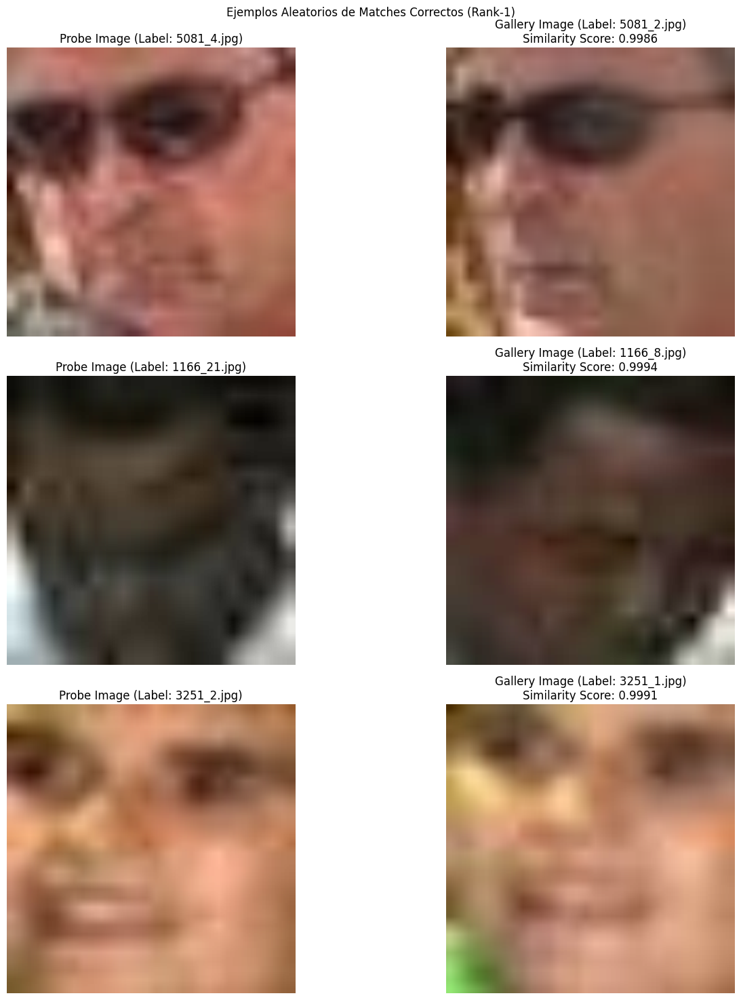


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:13<00:00, 10.27it/s]


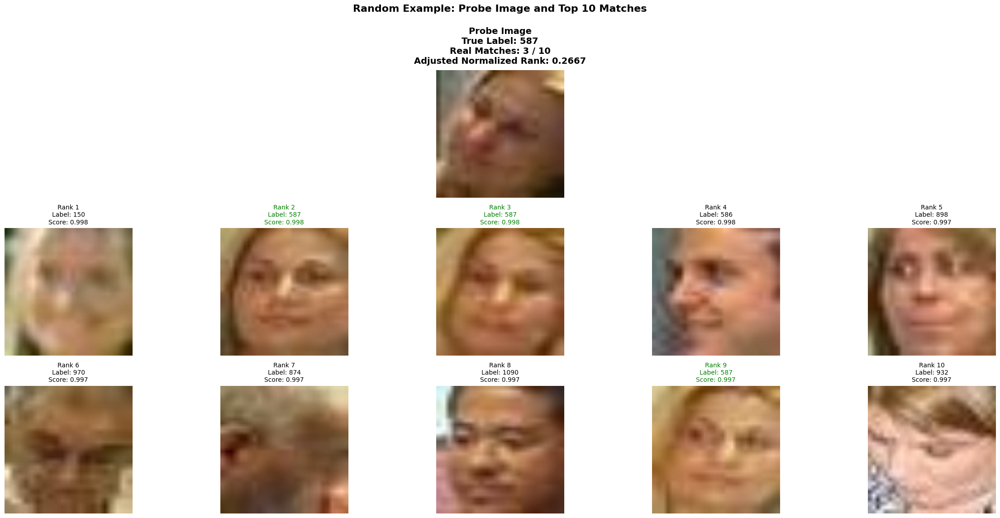

Ranking Normalizado Ajustado para este ejemplo: 0.2667
Tiempo de evaluación:  67.09411263465881

Evaluando mobilenet_v3 en low resolution...
Procesando galería...


100%|██████████| 139/139 [00:07<00:00, 18.59it/s]


Procesando probe images...


100%|██████████| 117/117 [00:06<00:00, 18.71it/s]


Calculando similitudes...

Resultados para mobilenet_v3:
Rank-1 Accuracy: 0.3785
Rank-20 Accuracy: 0.6317
Mean Average Precision (mAP): 0.3357

Ejemplos aleatorios de matches correctos de rank-1:


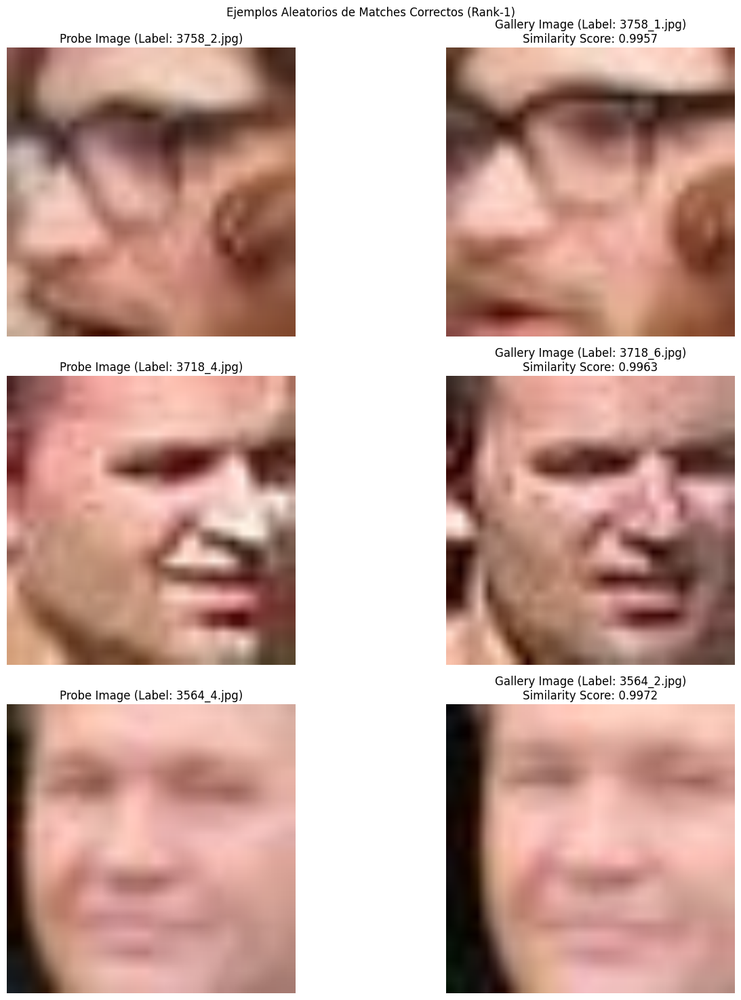


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:07<00:00, 18.35it/s]


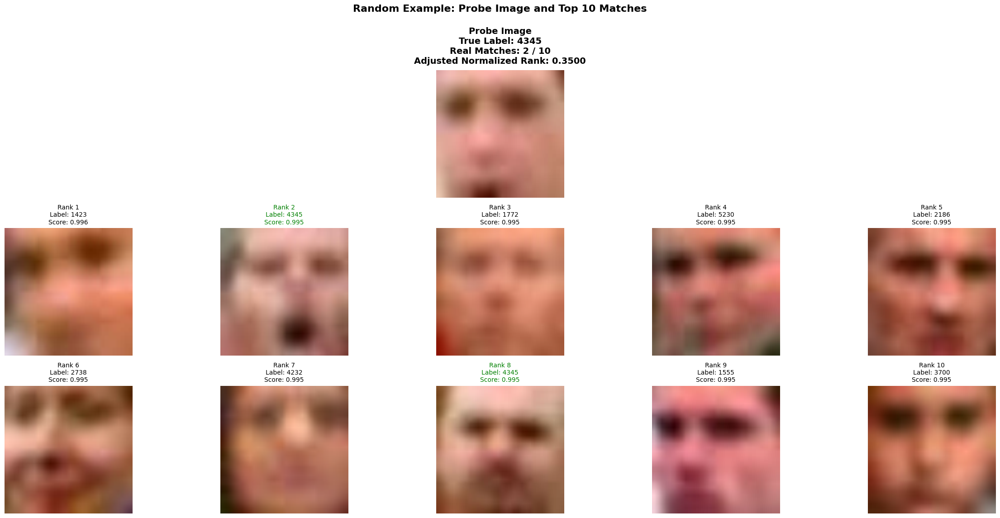

Ranking Normalizado Ajustado para este ejemplo: 0.3500
Tiempo de evaluación:  49.68578815460205

Evaluando efficientnet_b0 en low resolution...
Procesando galería...


100%|██████████| 139/139 [00:10<00:00, 13.75it/s]


Procesando probe images...


100%|██████████| 117/117 [00:08<00:00, 13.74it/s]


Calculando similitudes...

Resultados para efficientnet_b0:
Rank-1 Accuracy: 0.3385
Rank-20 Accuracy: 0.6054
Mean Average Precision (mAP): 0.3019

Ejemplos aleatorios de matches correctos de rank-1:


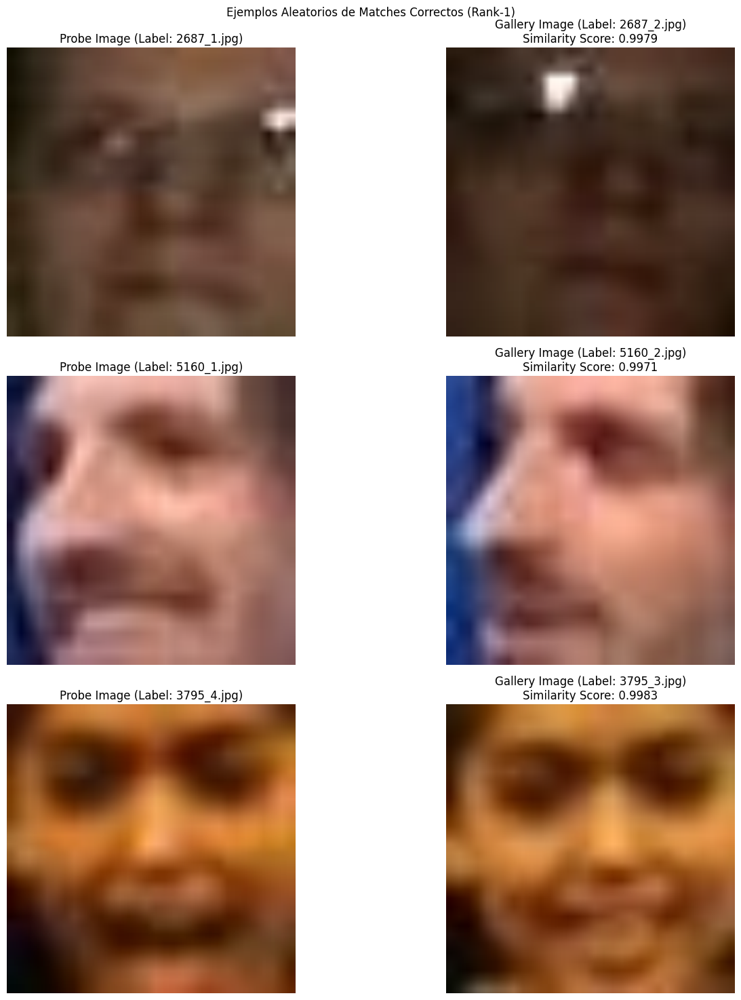


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:10<00:00, 13.75it/s]


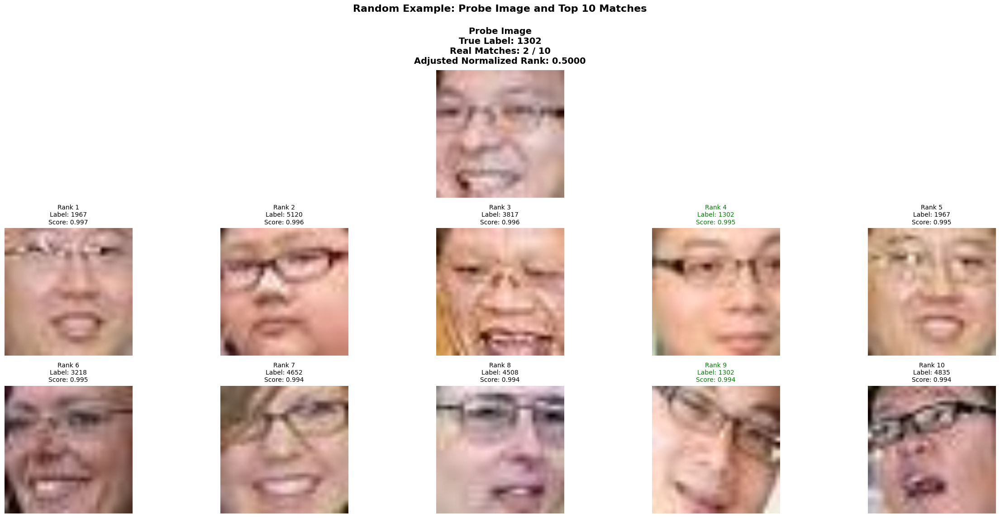

Ranking Normalizado Ajustado para este ejemplo: 0.5000
Tiempo de evaluación:  58.008709192276

Evaluando resnet50...
Procesando galería...


100%|██████████| 139/139 [00:14<00:00,  9.52it/s]


Procesando probe images...


100%|██████████| 117/117 [00:12<00:00,  9.62it/s]


Calculando similitudes...

Resultados para resnet50:
Rank-1 Accuracy: 0.3428
Rank-20 Accuracy: 0.5979
Mean Average Precision (mAP): 0.3070

Ejemplos aleatorios de matches correctos de rank-1:


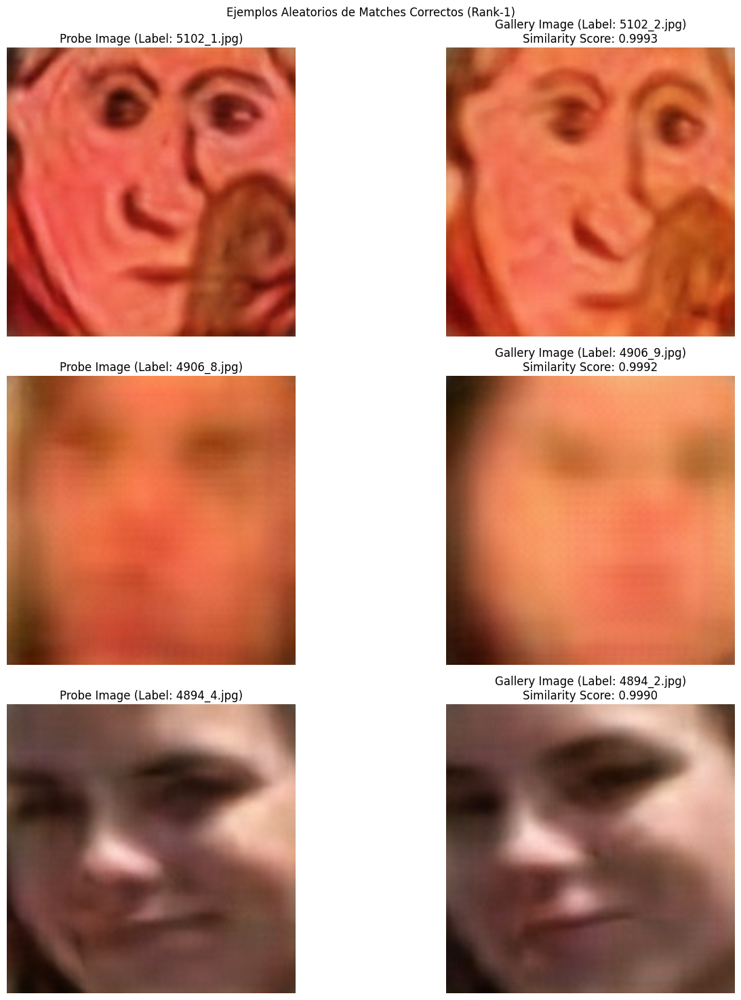


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:14<00:00,  9.46it/s]


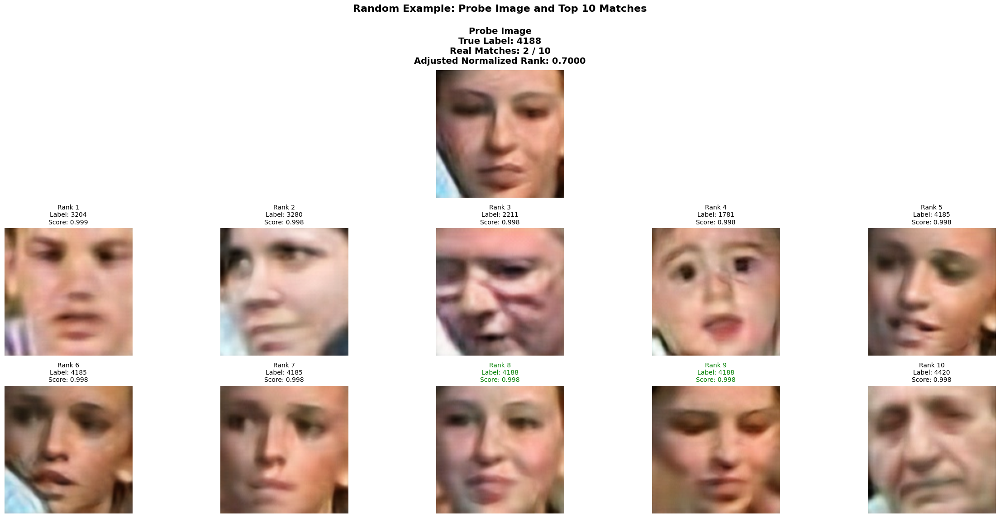

Ranking Normalizado Ajustado para este ejemplo: 0.7000
Tiempo de evaluación:  70.35758948326111

Evaluando mobilenet_v3...
Procesando galería...


100%|██████████| 139/139 [00:08<00:00, 16.41it/s]


Procesando probe images...


100%|██████████| 117/117 [00:07<00:00, 16.60it/s]


Calculando similitudes...

Resultados para mobilenet_v3:
Rank-1 Accuracy: 0.3675
Rank-20 Accuracy: 0.6250
Mean Average Precision (mAP): 0.3283

Ejemplos aleatorios de matches correctos de rank-1:


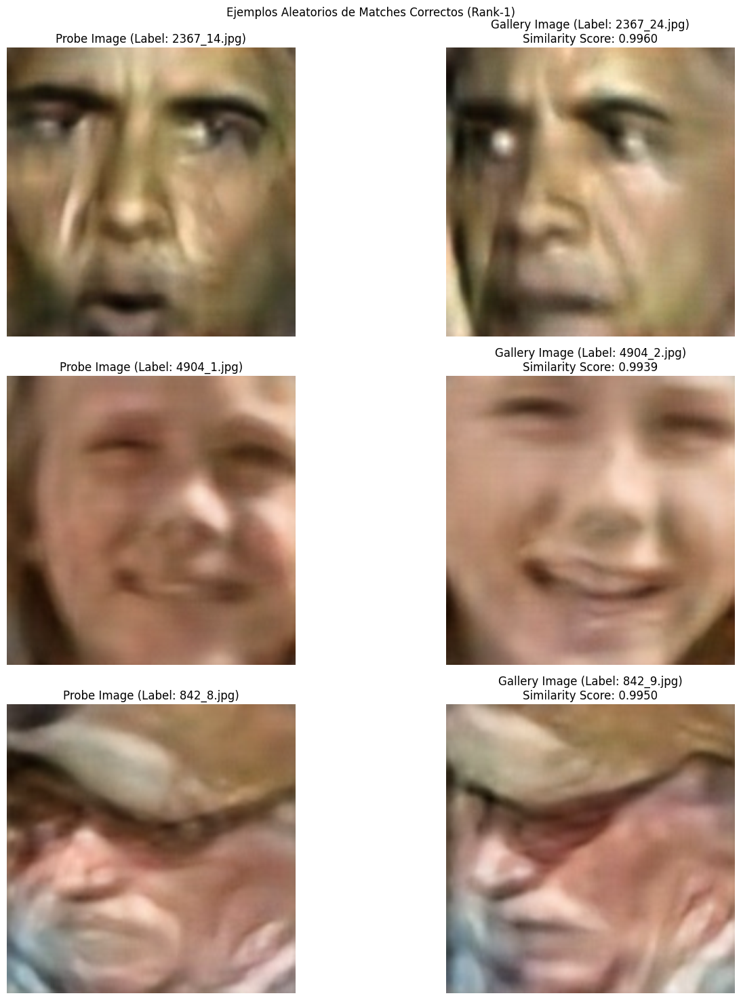


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:08<00:00, 16.21it/s]


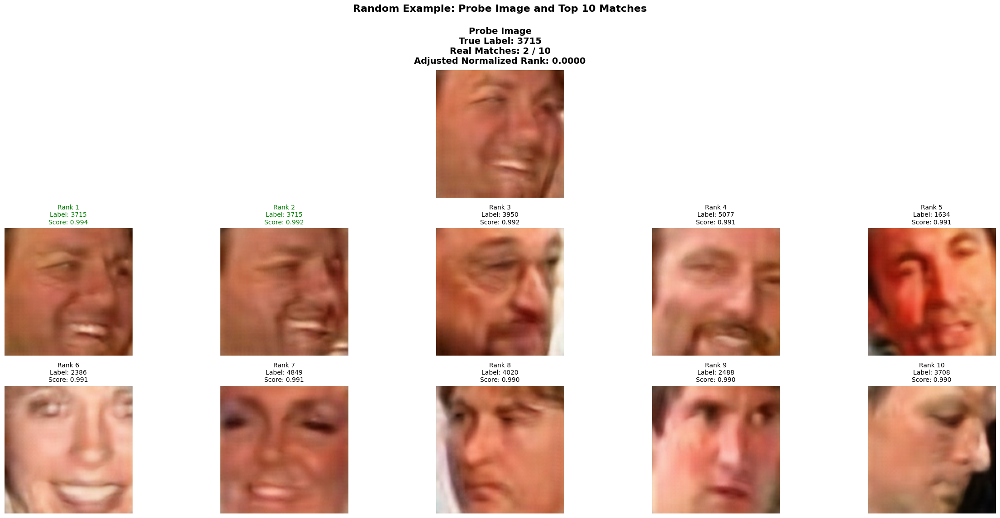

Ranking Normalizado Ajustado para este ejemplo: 0.0000
Tiempo de evaluación:  53.976174116134644

Evaluando efficientnet_b0...
Procesando galería...


100%|██████████| 139/139 [00:11<00:00, 12.38it/s]


Procesando probe images...


100%|██████████| 117/117 [00:09<00:00, 12.59it/s]


Calculando similitudes...

Resultados para efficientnet_b0:
Rank-1 Accuracy: 0.3302
Rank-20 Accuracy: 0.6022
Mean Average Precision (mAP): 0.2955

Ejemplos aleatorios de matches correctos de rank-1:


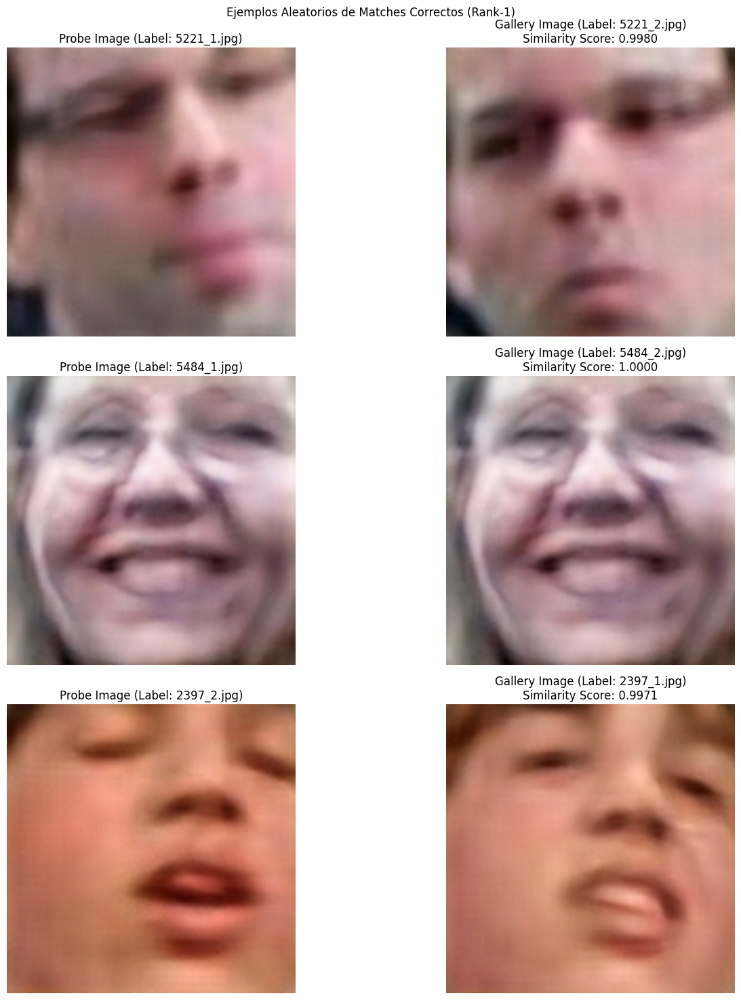


Mostrando ejemplo aleatorio con top 10 matches...
Precalculando características de la galería...


100%|██████████| 139/139 [00:11<00:00, 12.60it/s]


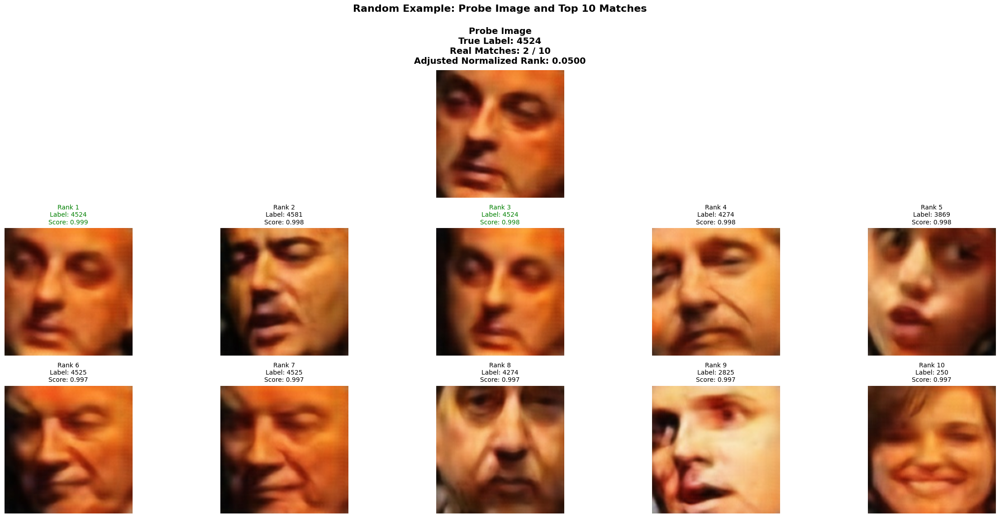

Ranking Normalizado Ajustado para este ejemplo: 0.0500
Tiempo de evaluación:  60.754859924316406

Resultados comparativos:

resnet50_lr:
Rank-1 Accuracy: 0.3425
Rank-20 Accuracy: 0.5995
Mean Average Precision (mAP): 0.3058

mobilenet_v3_lr:
Rank-1 Accuracy: 0.3785
Rank-20 Accuracy: 0.6317
Mean Average Precision (mAP): 0.3357

efficientnet_b0_lr:
Rank-1 Accuracy: 0.3385
Rank-20 Accuracy: 0.6054
Mean Average Precision (mAP): 0.3019

resnet50_sr:
Rank-1 Accuracy: 0.3428
Rank-20 Accuracy: 0.5979
Mean Average Precision (mAP): 0.3070

mobilenet_v3_sr:
Rank-1 Accuracy: 0.3675
Rank-20 Accuracy: 0.6250
Mean Average Precision (mAP): 0.3283

efficientnet_b0_sr:
Rank-1 Accuracy: 0.3302
Rank-20 Accuracy: 0.6022
Mean Average Precision (mAP): 0.2955


In [ ]:
from PIL import ImageDraw

def get_random_rank1_matches(similarity_matrix, probe_labels, gallery_labels, n_examples=3):
    """
    Encuentra n_examples matches aleatorios donde el rank-1 fue correcto
    """
    correct_matches = []
    for i, probe_label in enumerate(probe_labels):
        similarities = similarity_matrix[i]
        _, top_idx = torch.topk(similarities, k=1)
        if probe_label == gallery_labels[top_idx]:
            correct_matches.append((i, top_idx.item(), similarities[top_idx].item()))
    
    # Selecciona 3 ejemplos aleatorios
    if len(correct_matches) >= n_examples:
        return random.sample(correct_matches, n_examples)
    return correct_matches

def show_match_examples(probe_loader, gallery_loader, matches, title):
    """
    Muestra múltiples ejemplos de matches entre imágenes probe y gallery con transformaciones aplicadas.
    """
    n_matches = len(matches)
    fig = plt.figure(figsize=(15, 5 * n_matches))

    for idx, (probe_idx, gallery_idx, score) in enumerate(matches):
        # Carga las imágenes con transformaciones
        probe_img, _ = probe_loader.dataset[probe_idx]
        gallery_img, _ = gallery_loader.dataset[gallery_idx]

        # Convierte las imágenes de tensor a numpy para visualización
        probe_img = probe_img.permute(1, 2, 0).numpy()
        gallery_img = gallery_img.permute(1, 2, 0).numpy()

        # Normaliza las imágenes para visualización
        probe_img = (probe_img - probe_img.min()) / (probe_img.max() - probe_img.min())
        gallery_img = (gallery_img - gallery_img.min()) / (gallery_img.max() - gallery_img.min())

        # Obtiene etiquetas
        probe_label = probe_loader.dataset.labels[probe_idx]
        gallery_label = gallery_loader.dataset.labels[gallery_idx]

        # Crea subplots para este par
        ax1 = plt.subplot(n_matches, 2, 2 * idx + 1)
        ax2 = plt.subplot(n_matches, 2, 2 * idx + 2)

        ax1.imshow(probe_img)
        ax1.set_title(f'Probe Image (Label: {probe_label})')
        ax1.axis('off')

        ax2.imshow(gallery_img)
        ax2.set_title(f'Gallery Image (Label: {gallery_label})\nSimilarity Score: {score:.4f}')
        ax2.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


def show_random_top10_matches(model, probe_loader, gallery_loader, device):
    """
    Muestra un ejemplo aleatorio con sus top 10 matches y calcula un ranking normalizado mejorado.
    """
    model.eval()

    # Precalcula todas las características de la galería
    print("Precalculando características de la galería...")
    all_gallery_features = []
    gallery_labels = []

    with torch.no_grad():
        for images, labels in tqdm(gallery_loader):
            images = images.to(device)
            features = model(images)
            features = F.normalize(features, p=2, dim=1)
            all_gallery_features.append(features.cpu())
            gallery_labels.extend(labels.numpy())

    all_gallery_features = torch.cat(all_gallery_features, dim=0)

    # Selección aleatoria de una imagen probe
    max_attempts = 1000
    for attempt in range(max_attempts):
        probe_idx = np.random.randint(0, len(probe_loader.dataset))
        probe_img, probe_label = probe_loader.dataset[probe_idx]
        probe_img = probe_img.unsqueeze(0).to(device)

        with torch.no_grad():
            probe_features = model(probe_img)
            probe_features = F.normalize(probe_features, p=2, dim=1)

        similarities = torch.mm(probe_features.cpu(), all_gallery_features.t())
        similarities = (similarities + 1) / 2
        similarities = torch.pow(similarities, 2)

        top_scores, top_indices = torch.topk(similarities[0], k=10)
        top_labels = [gallery_labels[idx] for idx in top_indices]

        probe_label_base = str(probe_label).split("_")[0]
        correct_matches = sum(1 for label in top_labels if str(label).split("_")[0] == probe_label_base)

        if correct_matches >= 2:
            break
    else:
        print("No se encontró una imagen probe con suficientes matches después de {} intentos.".format(max_attempts))
        return

    # Calcular ranking normalizado mejorado
    ideal_positions = list(range(1, correct_matches + 1))
    actual_positions = [
        i + 1 for i, label in enumerate(top_labels) if str(label).split("_")[0] == probe_label_base
    ]
    if correct_matches > 0:
        normalized_rank = sum(abs(p_a - p_i) for p_a, p_i in zip(actual_positions, ideal_positions)) / len(actual_positions)
        normalized_rank /= 10  # Normalizar al rango [0,1]
    else:
        normalized_rank = 1.0

    # Mostrar la imagen probe con transformación
    probe_img = probe_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
    probe_img = (probe_img - probe_img.min()) / (probe_img.max() - probe_img.min())

    plt.figure(figsize=(24, 12), dpi=100)

    ax_probe = plt.subplot2grid((3, 5), (0, 1), colspan=3)
    ax_probe.imshow(probe_img)
    ax_probe.set_title(
        f'Probe Image\nTrue Label: {probe_label}\n'
        f'Real Matches: {correct_matches} / 10\n'
        f'Adjusted Normalized Rank: {normalized_rank:.4f}',
        pad=10, fontsize=14, fontweight='bold'
    )
    ax_probe.axis('off')

    # Mostrar las top 10 imágenes de la galería con transformaciones
    for i in range(10):
        row = (i // 5) + 1
        col = i % 5
        ax = plt.subplot2grid((3, 5), (row, col))

        gallery_img, _ = gallery_loader.dataset[top_indices[i]]
        gallery_img = gallery_img.permute(1, 2, 0).numpy()
        gallery_img = (gallery_img - gallery_img.min()) / (gallery_img.max() - gallery_img.min())

        match_label = str(top_labels[i]).split("_")[0]
        ax.imshow(gallery_img)
        ax.set_title(
            f'Rank {i+1}\nLabel: {top_labels[i]}\nScore: {top_scores[i]:.3f}',
            fontsize=10,
            color='green' if match_label == probe_label_base else 'black'
        )
        ax.axis('off')

    plt.suptitle('Random Example: Probe Image and Top 10 Matches', fontsize=16, fontweight='bold', y=0.95)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    print(f"Ranking Normalizado Ajustado para este ejemplo: {normalized_rank:.4f}")




def calculate_map(similarity_matrix, probe_labels, gallery_labels):
    """
    Calcula el mean Average Precision (mAP).
    """
    aps = []  # Almacena el Average Precision para cada probe
    for i, probe_label in enumerate(probe_labels):
        similarities = similarity_matrix[i]
        sorted_indices = torch.argsort(similarities, descending=True)
        relevant_retrieved = 0
        precision_sum = 0.0
        
        for rank, idx in enumerate(sorted_indices):
            if gallery_labels[idx] == probe_label:
                relevant_retrieved += 1
                precision_sum += relevant_retrieved / (rank + 1)
        
        if relevant_retrieved > 0:
            aps.append(precision_sum / relevant_retrieved)
        else:
            aps.append(0)
    
    return sum(aps) / len(aps)



def calculate_rankings(model, probe_loader, gallery_loader, device, ranks=[1, 20]):
    """
    Calcula los rankings especificados para el modelo
    """
    model.eval()
    all_gallery_features = []
    all_gallery_labels = []
    all_probe_features = []
    all_probe_labels = []
    
    # Extrae características de la galería
    print("Procesando galería...")
    with torch.no_grad():
        for images, labels in tqdm(gallery_loader):
            images = images.to(device)
            features = model(images)
            features = F.normalize(features, p=2, dim=1)
            all_gallery_features.append(features.cpu())
            all_gallery_labels.extend(labels.numpy())
            
    all_gallery_features = torch.cat(all_gallery_features, dim=0)
    
    # Extrae características de las probe images
    print("Procesando probe images...")
    with torch.no_grad():
        for images, labels in tqdm(probe_loader):
            images = images.to(device)
            features = model(images)
            features = F.normalize(features, p=2, dim=1)
            all_probe_features.append(features.cpu())
            all_probe_labels.extend(labels.numpy())
            
    all_probe_features = torch.cat(all_probe_features, dim=0)
    
    # Calcula matriz de similitud con la misma transformación que en show_random_top10_matches
    print("Calculando similitudes...")
    similarity_matrix = torch.mm(all_probe_features, all_gallery_features.t())
    similarity_matrix = (similarity_matrix + 1) / 2
    similarity_matrix = torch.pow(similarity_matrix, 2)
    
    # Obtiene 3 matches aleatorios de rank-1
    random_matches = get_random_rank1_matches(
        similarity_matrix, 
        all_probe_labels, 
        all_gallery_labels
    )
    map_score = calculate_map(similarity_matrix, all_probe_labels, all_gallery_labels)
    # Calcula accuracies para cada rank
    accuracies = {}
    for rank in ranks:
        correct = 0
        total = 0
        
        for i, probe_label in enumerate(all_probe_labels):
            similarities = similarity_matrix[i]
            _, top_indices = torch.topk(similarities, k=rank)
            top_labels = [all_gallery_labels[idx] for idx in top_indices]
            
            if probe_label in top_labels:
                correct += 1
            total += 1
        
        accuracies[rank] = correct / total
    
    return accuracies, random_matches, map_score

def evaluate_trained_model(model_name, checkpoint_path, probe_loader, gallery_loader, device):
    """
    Evalúa un modelo entrenado
    """
    print(f"\nEvaluando {model_name}...") if "sr" in checkpoint_path else print(f"\nEvaluando {model_name} en low resolution...")
    
    # Carga el modelo
    model = get_model(model_name, num_classes=2570)
    checkpoint = torch.load(checkpoint_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    model = model.to(device)
    model.eval()
    
    # Calcula rankings y obtiene ejemplos aleatorios
    accuracies, random_matches, score = calculate_rankings(
        model, probe_loader, gallery_loader, device
    )
    
    # Muestra resultados
    print(f"\nResultados para {model_name}:")
    for rank, acc in accuracies.items():
        print(f"Rank-{rank} Accuracy: {acc:.4f}")
    print(f"Mean Average Precision (mAP): {score:.4f}")
    
    # Muestra ejemplos aleatorios de matches correctos
    if random_matches:
        print("\nEjemplos aleatorios de matches correctos de rank-1:")
        show_match_examples(
            probe_loader, gallery_loader,
            random_matches,
            "Ejemplos Aleatorios de Matches Correctos (Rank-1)"
        )
    
    # Muestra ejemplo aleatorio con top 10
    print("\nMostrando ejemplo aleatorio con top 10 matches...")
    show_random_top10_matches(model, probe_loader, gallery_loader, device)
    
    return accuracies, score

def main():
    # Configuración
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    # Transformaciones (las mismas que en el entrenamiento)
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    
    # Carga los datasets
    gallery_set = TinyFaceDataset('tinyface_sr/Testing_Set/Gallery_Match', transform, is_train=False)
    gallery_loader = DataLoader(gallery_set, batch_size=32, shuffle=False)
    probe_set = TinyFaceDataset('tinyface_sr/Testing_Set/Probe', transform, is_train=False)
    probe_loader = DataLoader(probe_set, batch_size=32, shuffle=False)
    
    # Carga datasets low resolucion
    gallery_set_lr = TinyFaceDataset('tinyface/Testing_Set/Gallery_Match', transform, is_train=False)
    gallery_loader_lr = DataLoader(gallery_set_lr, batch_size=32, shuffle=False)
    probe_set_lr = TinyFaceDataset('tinyface/Testing_Set/Probe', transform, is_train=False)
    probe_loader_lr = DataLoader(probe_set_lr, batch_size=32, shuffle=False)
    
    # Lista de modelos a evaluar
    models_to_evaluate = [
        ("resnet50", "resnet50_tinyface_checkpoint.pth"),
        ("mobilenet_v3", "mobilenet_v3_tinyface_checkpoint.pth"),
        ("efficientnet_b0", "efficientnet_b0_tinyface_checkpoint.pth"),
        ("resnet50", "resnet50_tinyface_sr_checkpoint.pth"),
        ("mobilenet_v3", "mobilenet_v3_tinyface_sr_checkpoint.pth"),
        ("efficientnet_b0", "efficientnet_b0_tinyface_sr_checkpoint.pth")
    ]
    
    # Evalúa cada modelo
    results = {}
    for model_name, checkpoint_path in models_to_evaluate:
        try:
            start_time = time.time()
            if "sr" in checkpoint_path:
                results[model_name + "_sr"] = evaluate_trained_model(
                    model_name,
                    checkpoint_path,
                    probe_loader,
                    gallery_loader,
                    device
                )
            else:
                results[model_name + "_lr"] = evaluate_trained_model(
                    model_name,
                    checkpoint_path,
                    probe_loader_lr,
                    gallery_loader_lr,
                    device
                )
            end = time.time()
            print("Tiempo de evaluación: ", end - start_time)
        except FileNotFoundError:
            print(f"\nNo se encontró el checkpoint para {model_name}")
            continue
    
    # Muestra resultados comparativos
    print("\nResultados comparativos:")
    for model_key, (accuracies, score) in results.items():
        print(f"\n{model_key}:")
        for rank, acc in accuracies.items():
            print(f"Rank-{rank} Accuracy: {acc:.4f}")
        print(f"Mean Average Precision (mAP): {score:.4f}")

if __name__ == "__main__":
    main()

## Imagen de test

/tmp/ipykernel_3586/1417523385.py:65: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path)


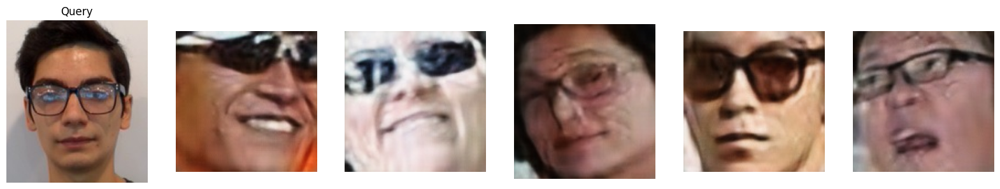

In [23]:
def evaluate_image_top5(image_path, model, dataset_loader, device):
    """
    Evalúa una imagen específica para encontrar las 5 más similares en el dataset.
    """
    # Transformación para la imagen
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    
    # Cargar la imagen
    img = Image.open(image_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)
    
    # Extraer características de la imagen
    model.eval()
    with torch.no_grad():
        img_features = model(img_tensor)
        img_features = torch.nn.functional.normalize(img_features, p=2, dim=1)
    
    # Comparar con el dataset
    all_features = []
    all_labels = []
    all_paths = []
    with torch.no_grad():
        for batch_imgs, batch_labels in dataset_loader:
            batch_imgs = batch_imgs.to(device)
            features = model(batch_imgs)
            features = torch.nn.functional.normalize(features, p=2, dim=1)
            all_features.append(features.cpu())
            all_labels.extend(batch_labels.numpy())
            all_paths.extend(dataset_loader.dataset.image_paths)
    
    all_features = torch.cat(all_features, dim=0)
    
    # Calcular similitudes
    similarities = torch.mm(img_features.cpu(), all_features.t())[0]
    similarities = (similarities + 1) / 2
    similarities = torch.pow(similarities, 2)
    
    # Top 5 matches
    top_scores, top_indices = torch.topk(similarities, k=5)
    top_paths = [all_paths[i] for i in top_indices]
    
    # Visualizar resultados
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 6, 1)
    plt.imshow(img)
    plt.title("Query")
    plt.axis("off")
    
    for i, path in enumerate(top_paths):
        img_match = Image.open(path)
        plt.subplot(1, 6, i + 2)
        plt.imshow(img_match)
        plt.axis("off")
    
    plt.show()

# Uso del modelo
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = get_model("resnet50", num_classes=2570)
checkpoint_path = "resnet50_tinyface_sr_checkpoint.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)

# Dataset
# Transformación para normalizar las imágenes
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Asegúrate de que coincide con el tamaño esperado por el modelo
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

# Dataset con transformaciones aplicadas
gallery_set = TinyFaceDataset('tinyface_sr/Testing_Set/Gallery_Match', transform=transform, is_train=False)
gallery_loader = DataLoader(gallery_set, batch_size=32, shuffle=False)

# Imagen de prueba
image_path = "./test.jpg"  # Reemplaza con la ruta de tu imagen
evaluate_image_top5(image_path, model, gallery_loader, device)

## Tiempos de inferencia

In [12]:
import os
import torch
import time
from torchvision import transforms
from PIL import Image

def measure_inference_time(models, image, device):
    """
    Mide el tiempo de inferencia para cada modelo en una misma imagen.
    
    Args:
        models (dict): Diccionario con los modelos a evaluar.
                       Clave: nombre del modelo, Valor: instancia del modelo.
        image (torch.Tensor): Imagen a procesar (debe incluir batch dimension).
        device (torch.device): Dispositivo a usar (CPU o CUDA).
    
    Returns:
        dict: Tiempos de inferencia en segundos para cada modelo.
    """
    image = image.to(device)
    times = {}
    
    for model_name, model in models.items():
        model = model.to(device)
        model.eval()
        
        # Calcular tiempo de inferencia
        start_time = time.perf_counter()
        with torch.no_grad():
            _ = model(image)
        end_time = time.perf_counter()
        
        times[model_name] = end_time - start_time
    
    return times

# Ejemplo de uso
if __name__ == "__main__":
    # Configuración
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    
    # Cargar los modelos
    models = {
        "resnet50": get_model("resnet50", num_classes=2570),
        "mobilenet_v3": get_model("mobilenet_v3", num_classes=2570),
        "efficientnet_b0": get_model("efficientnet_b0", num_classes=2570),
        "resnet50_sr": get_model("resnet50", num_classes=2570),
        "mobilenet_v3_sr": get_model("mobilenet_v3", num_classes=2570),
        "efficientnet_b0_sr": get_model("efficientnet_b0", num_classes=2570),
    }
    models_to_evaluate = [
        ("resnet50", "resnet50_tinyface_checkpoint.pth"),
        ("mobilenet_v3", "mobilenet_v3_tinyface_checkpoint.pth"),
        ("efficientnet_b0", "efficientnet_b0_tinyface_checkpoint.pth"),
        ("resnet50", "resnet50_tinyface_sr_checkpoint.pth"),
        ("mobilenet_v3", "mobilenet_v3_tinyface_sr_checkpoint.pth"),
        ("efficientnet_b0", "efficientnet_b0_tinyface_sr_checkpoint.pth")
    ]
    
    # Cargar pesos preentrenados
    for model_name in models.keys():
        checkpoint_path = f"{model_name}_checkpoint.pth"
        if os.path.exists(checkpoint_path):
            checkpoint = torch.load(checkpoint_path)
            models[model_name].load_state_dict(checkpoint['model_state_dict'])
    
    # Preparar la imagen de prueba
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    test_image_path = "./tinyface_sr/Training_Set/3/3_11.jpg"
    test_image = transform(Image.open(test_image_path).convert("RGB")).unsqueeze(0)  # Añadir dimensión batch
    
    # Medir tiempos
    inference_times = measure_inference_time(models, test_image, device)
    for model_name, time_taken in inference_times.items():
        print(f"Modelo: {model_name}, Tiempo de inferencia: {time_taken:.6f} segundos")

Modelo: resnet50, Tiempo de inferencia: 0.005227 segundos
Modelo: mobilenet_v3, Tiempo de inferencia: 0.005641 segundos
Modelo: efficientnet_b0, Tiempo de inferencia: 0.007228 segundos
Modelo: resnet50_sr, Tiempo de inferencia: 0.005203 segundos
Modelo: mobilenet_v3_sr, Tiempo de inferencia: 0.005600 segundos
Modelo: efficientnet_b0_sr, Tiempo de inferencia: 0.007811 segundos


## Comparar imagen original, imagen con SR y imagen con resize

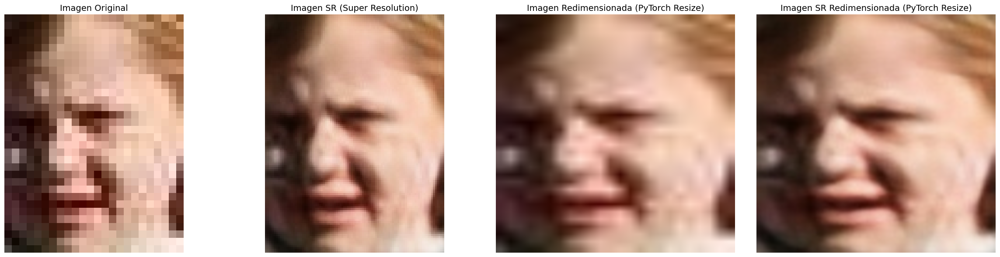

In [19]:
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import Resize, ToTensor
from PIL import Image

def compare_image_versions(original_image, sr_image, resized_image, resized_sr_image):
    """
    Compara una imagen original, una generada por un modelo SR y dos redimensionadas por PyTorch.
    
    Args:
    - original_image: Tensor o array de la imagen original (C, H, W).
    - sr_image: Tensor o array de la imagen procesada por SR (C, H, W).
    - resized_image: Tensor o array de la imagen redimensionada por PyTorch (C, H, W).
    - resized_sr_image: Tensor o array de la imagen SR redimensionada por PyTorch (C, H, W).
    """
    # Normalizar imágenes para visualización si son tensores
    def normalize_img(img):
        if torch.is_tensor(img):
            img = img.permute(1, 2, 0).numpy()  # Reordenar a (H, W, C)
        img = (img - img.min()) / (img.max() - img.min())  # Normalizar entre 0 y 1
        return img

    original_image = normalize_img(original_image)
    sr_image = normalize_img(sr_image)
    resized_image = normalize_img(resized_image)
    resized_sr_image = normalize_img(resized_sr_image)

    # Crear figura para visualizar
    plt.figure(figsize=(24, 6))

    # Mostrar imagen original
    plt.subplot(1, 4, 1)
    plt.imshow(original_image)
    plt.title("Imagen Original", fontsize=14)
    plt.axis('off')

    # Mostrar imagen SR
    plt.subplot(1, 4, 2)
    plt.imshow(sr_image)
    plt.title("Imagen SR (Super Resolution)", fontsize=14)
    plt.axis('off')

    # Mostrar imagen redimensionada
    plt.subplot(1, 4, 3)
    plt.imshow(resized_image)
    plt.title("Imagen Redimensionada (PyTorch Resize)", fontsize=14)
    plt.axis('off')

    # Mostrar imagen SR redimensionada
    plt.subplot(1, 4, 4)
    plt.imshow(resized_sr_image)
    plt.title("Imagen SR Redimensionada (PyTorch Resize)", fontsize=14)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Cargar imágenes
original_img_path = "./tinyface/Training_Set/8/8_28.jpg"
sr_img_path = "./tinyface_sr/Training_Set/8/8_28.jpg"  # Procesada por SR

original_img = Image.open(original_img_path)
sr_img = Image.open(sr_img_path)

# Convertir a tensor
to_tensor = ToTensor()
original_img_tensor = to_tensor(original_img)
sr_img_tensor = to_tensor(sr_img)

# Redimensionar imágenes
resize_transform = Resize((256, 256))
resized_img_tensor = resize_transform(original_img_tensor)
resized_sr_img_tensor = resize_transform(sr_img_tensor)

# Comparar las versiones
compare_image_versions(original_img_tensor, sr_img_tensor, resized_img_tensor, resized_sr_img_tensor)